In [1]:
# performing sentiments analysis on Youtube comments

In [2]:
#import all necessary libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# Read Dataset(Comments),which is in csv file formet

In [5]:
 comments = pd.read_csv(r"path\Youtube Project\GBcomments.csv",error_bad_lines=False)# To remove parser error

b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


In [6]:
comments.head() 

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


In [7]:
# install textblob library
! pip install textblob

In [8]:
# Import TextBlob module form textblob library
from textblob import TextBlob

In [9]:
# check Polarity of the one comment as a sample 
TextBlob("It's more accurate to call it the M+ (1000) be...	").sentiment.polarity

0.45000000000000007

In [10]:
# check null values in comments column
comments.isna().sum()

video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [11]:
# Remove all null values 
comments.dropna(inplace = True)  # updating dataset as well

In [12]:
# performing sentiment analysis for each element in the comments Column

In [13]:
polarity = []
for i in comments["comment_text"]: 
    polarity.append(TextBlob(i).sentiment.polarity)

In [14]:
# Add a New column in dataset of name polarity with their respective values
comments["polarity"] = polarity

In [15]:
comments.head(10)

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.450000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.000000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.000000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.000000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.000000
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,0.300000
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,0.000000
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,-0.100000
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,0.028571
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,0.500000


In [16]:
# Perform Exponetial Data analysis with positive and negative sentiments


In [17]:
comments_Positive = comments[comments["polarity"] == 1]
comments_Positive.head()

,video_id,comment_text,likes,replies,polarity
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.0
26,jt2OHQh0HoQ,The best thing to ever happen to iPhone,0,2,1.0
80,jt2OHQh0HoQ,Apple is always awesome \n\nhttps://youtu.be/r...,0,1,1.0
158,YPVcg45W0z4,das a lot of edditing you have done there ... ...,0,0,1.0
175,YPVcg45W0z4,Welcome to the Scandiworld!,0,0,1.0


In [18]:
comments_Positive.shape

(20400, 5)

In [19]:
# install wordcloud library , To show some of most frequent comment 
! pip install wordcloud

In [20]:
# import WordCloud and STOPWORDS(he,she, it, they,then....) modules from wordcloud library 
from wordcloud import WordCloud,STOPWORDS

In [21]:
stopwords =set(STOPWORDS)# unique stopwords

In [22]:
# perfoming join opertion on positive comments
total_comments= " ".join(comments_Positive["comment_text"])

In [23]:
wordcloud =WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)

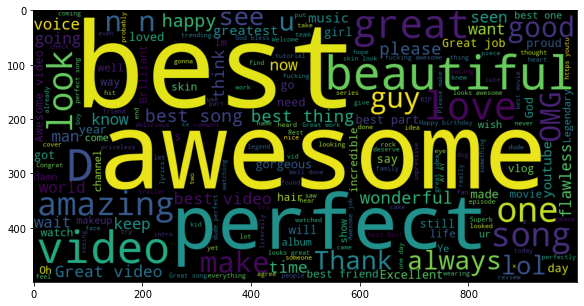

In [24]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis=("off")

In [25]:
# for negative polarity

In [26]:
comments_Negative = comments[comments["polarity"] == -1]
comments_Negative.head()

,video_id,comment_text,likes,replies,polarity
1387,ql0Op1VcELw,boring,0,0,-1.0
1394,ql0Op1VcELw,0:22 **laughs at terrible pun**,1,1,-1.0
1530,-Ifnaxi2LQg,this is the worst thing i've heard. ever.,0,0,-1.0
1745,F2uJvwiSZAQ,People making jokes about 9/11 is truly disgus...,1,0,-1.0
1793,F2uJvwiSZAQ,Thats insane.,0,0,-1.0


In [27]:
total_comments2= " ".join(comments_Negative["comment_text"])

In [28]:
wordcloud =WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments2)

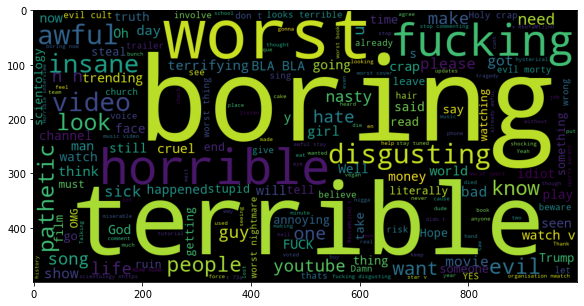

In [29]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis=("off")

In [30]:
def wordcloud(df):
    total_comments= " ".join(df["comment_text"]) # column name
    wordcloud =WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)
    plt.figure(figsize=(15,5))
    plt.imshow(wordcloud)
    plt.axis=("off")

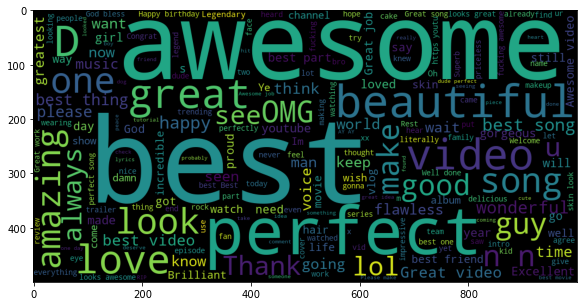

In [31]:
wordcloud(comments_Positive)

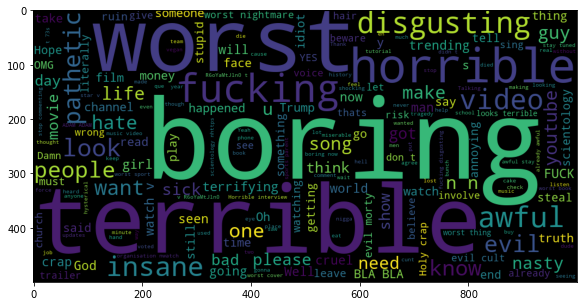

In [32]:
wordcloud(comments_Negative)

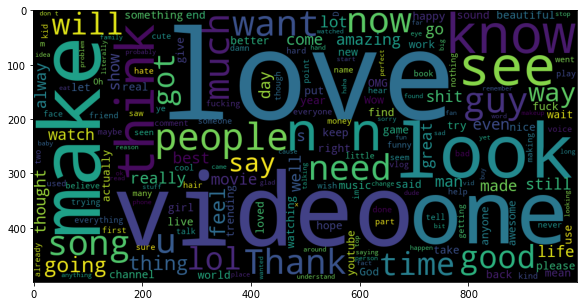

In [33]:
wordcloud(comments)

In [34]:
# Analysing Trending Tags in Youtube

In [35]:
videos=pd.read_csv(r"path\Youtube Project\USvideos.csv",error_bad_lines=False)

b'Skipping line 2401: expected 11 fields, saw 21\nSkipping line 2800: expected 11 fields, saw 21\nSkipping line 5297: expected 11 fields, saw 12\nSkipping line 5299: expected 11 fields, saw 12\nSkipping line 5300: expected 11 fields, saw 12\nSkipping line 5301: expected 11 fields, saw 12\n'


In [36]:
videos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09


In [37]:
videos["tags"]

0       logan paul vlog|logan paul|logan|paul|olympics...
1       Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...
2                                                  [none]
3       apple iphone x hands on|Apple iPhone X|iPhone ...
4       jacksfilms|parody|parodies|iphone|iphone x|iph...
                              ...                        
7987    sinkhole|how do sinkholes form|sinkhole in wat...
7988    Business Insider|Donald Trump|Hillary Clinton|...
7989    LP|Death Valley|Other People|Lost On You|The M...
7990    YouTube FanFest|#YTFF|Washington DC|USA|YTFF|#...
7991    LIGO|Virgo|collaboration|space|science|nationa...
Name: tags, Length: 7992, dtype: object

In [38]:
# joining the tags
tags_complete=" ".join(videos["tags"])

In [39]:
tags_complete

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [40]:
import re

In [41]:
# Reject other than a-z or A-Z
re.sub("[^a-zA-Z]"," ",tags_complete)

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button   M subscribers logan paul   year vlogging   year vlog dwarf mamba play button logan paul history youtube history   M   M plaque youtube button diamond button logang logang   life Apple iPhone    iPhone Ten iPhone Portrait Lighting A   Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone  none  apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event      apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone      apple iphone ios    the verge verge jacksfilms parody parodies iphone iphone x iphone   apple emoji a   a   films a   trailers independent films trailer HD official movie film a   movies oscar 

In [42]:
tags=re.sub(" +"," ",tags_complete)

In [43]:
tags

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

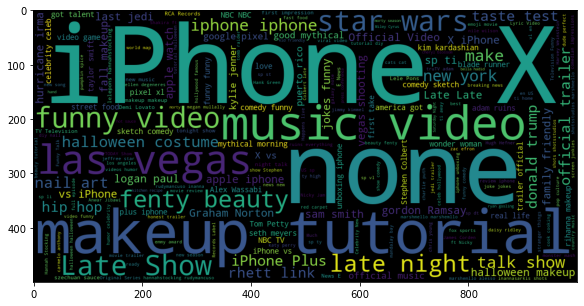

In [44]:
wordcloud =WordCloud(width=1000,height=500,stopwords=stopwords).generate(tags)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis=("off")

In [45]:
# perform analysis on views likes and dislikes and their co relation

<AxesSubplot:xlabel='views', ylabel='likes'>

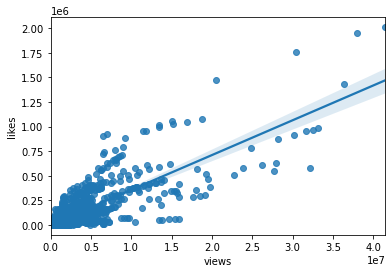

In [46]:
# To show the correation we can go for regrasion plot
# Regresion plot for views and likes
sns.regplot(data=videos,x="views",y="likes")

<AxesSubplot:xlabel='views', ylabel='dislikes'>

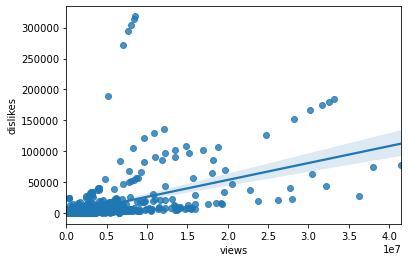

In [47]:
# regresion plot for views and dislikes
sns.regplot(data=videos,x="views",y="dislikes")

In [48]:
# show coorealtion among all

In [49]:
df_corr=videos[["views","likes","dislikes"]]

In [50]:
df_corr.corr() # function to show coorelation

,views,likes,dislikes
views,1.000000,0.832844,0.541955
likes,0.832844,1.000000,0.497439
dislikes,0.541955,0.497439,1.000000


<AxesSubplot:>

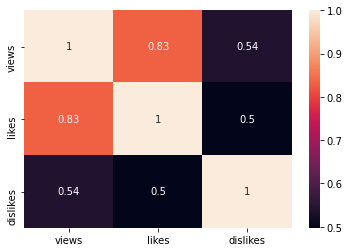

In [51]:
# plot coor
sns.heatmap(df_corr.corr(),annot=True) # show with values

In [52]:
# Emoji's analysis

In [53]:
comments.head()

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.45
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.00
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.00
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.00
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.00


In [54]:
comments["comment_text"][1] # for one comment

'To be there with a samsung phone\\n😂😂😂'

In [55]:
# emojis are in form of unicode char

In [56]:
import emoji

In [57]:
len(comments)


718424

In [58]:
comment = comments["comment_text"][1]

In [59]:
# iterating comment char by char
[c for c in comment if c in emoji.UNICODE_EMOJI]

['😂', '😂', '😂']

In [60]:
# store emojis in str
str =""
for i in comments["comment_text"]:
    list = [c for c in i if c in emoji.UNICODE_EMOJI]
    for ele in list:
        str=str+ele



In [61]:
len(str)


341868

In [62]:
str

'😂😂😂😭😭😭😢😢😢❤❤😂👏👇👇👇👇👇👇👇👇👇👇🌞😎😣😥😫😭✌😂👎🏻👎🏻👎🏻👎🏻😂🖕😘😘▶⏭⏮◀🔥🔥😊😊🤔🤔😂😂😂😂👏🏻👏🏻❤❤😜😍😍😅❤😍😍✌😂😂😂😊😂😂😂😂😏😏🇪🇸😭💔😊❤❤❤❤❤😂😂😊❤😂🤣✨🌈😘😂😂❤😊😂😊😂💗😂😊😊😊💖🐢😉😍😂😂💗💗😻😻❤😂😂❤❤🤗👌🏼👌🏼😂😂😂😂💖😩🙊♥♥♥😂😂😂💙💙💙💙💙💙😂😂😂❤❤❤😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😱😊😛🌳🌽🎃🚣🚂😂😂😊😕😋🤣😅😢💔😂😊🤡🙏🙏🙏👊🏿🙇🏽👋😅😅😅😅😂😂🤔😎😎😎😎😎😎😎😍😍😍😍😍😍😘😘😘😘😘😘😘😲🖕💪🤘💓☺☺😂😂😂💕😄😄😍💕😉😩❤❤💕❤😂💕😍💗👫💖😆💕💖💕😍😍😊😄😍😀💗🦄😍😊😂😊👍😍♥❤😂👶🏻🤗☺😘💙💙💙😍😍😊😎🤘🖤👌👌😍😂👌🍍😎😎😄😄😄😄😂😂😂😬💜💜💜😭😂😍😍💖😂😂😂😂😂😂😂😭😂😭😂😭😂😂😂😍😍😍😭😍😍😂👀👀🤔😂😂😂😂😂😂😂😂😂😂🍸🍸🍸🍸🍸😂😂😂🤣🤣🤣😂😂😂😂😍💜💜💜💜😂😂😂😅😂😍💖😂😻😉🔥❤😻❤😭😭😭😭😭😭😭👍🏻😍💚💙❤❤😫❤❤❤❤❤♥😍❤😊😍😎💄🐐😅😂😂😊😊👀👌🏽❤❤❤😂💖🎉💪💪🏽😎🙌🙌😜❤❤💛💛😎🙏💚🎉🎉❤🎉🎉🎉🎉🎊🎉🎊🎉😭💗😍😍😍😍😍😍😍👏✌😁❤❤😂💋💋👫💘😻💋💋😂👑🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥😂😐😑😩👌🏻🔥💖👏🏻👀✨👅💦💕❤😍🔥🔥🔥❤❤❤❤❤❤❤👌😍😍😍😞🌴💜💜💜💜😍😍😍😍😍❤❤❤❤❤😊❤❤❤❤🍔🍟🇺🇸😒🌿😄😄😄😉🍲🍱🎏❤💪👊🏽😘😂😂😂❤🙋☺😍😍😚💕😉😂❤❤😊☺💓🌸🙄🙄🙄🙁😞😊🙄😍😨😍😍😍😍😎😃😂😍😏😌😂😎🤑😂😉👍🏻🔥💯🚨😊☺😂😂😂🤣🙂❤❤😀😀😀♥♥😂❤😂😓😭😂❤❤😖😖😂😂😂💗💝😘💐💐💐😂😍☺😂❤😭💕🙌🏽🙌🏽🙌🏽😘😘❤❤💖😫😖📱😂😏🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😁🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😎😂😂👍🏼💯💕♥♥♥😱😱😱❤❤❤😍😍😩😩😩😩😩😩😩😍😻😻😻😻😻😳🥀♥♥♥♥♥♥😍😍😍🙃😂💕💕💕😍💕💕❤❤💕😍🍫🌹💖🇸🇸🇸🇸❤😍👸🏿👸🏿👸🏿👸🏿👸🏿💗😊😊😩❤👌🏼😻😊😍❤😂😂👏🏼❤❤❤❤❤😍😍😍💚💚💚💚💚😍😭🌹😍❤😍😍😍💚💚💚💚💚😍💚💚💚☺💙😀😍💚😕😍👌😂😂😂😍👌🏻💗❤💚💚💚😸😙😙😘💚💚💚💚😍😭😭💖💓💓💓😍❤😘😘🤗🤗🤗❤😀😀💓💓💓❤😂❤😍❤❤♥♥♥❤🙌❤😂❤❤😍❤💜😍😭😍😍😍😊💗💕😍❤💗💗💛💛💛💖💖😍😐😍😍😍😍🗿😂🤗😩😩😩💖💖💖❤❤❤❤❤😍😍✨😍👍🏻😁😂😍💅❤😘❤❤😈👀😄😈👍☝👆✊👌✌👊✋👋👏👐👉👈💔😂😂😬😭😥☺😂😂😂😂😍😍😍😜😂😂😂😂😂😒👎🏽😱😱😱😱😂😎😛🙊✊✌😑😑😑👌😊

In [63]:
# No of unique emoji and store as dict
result={}
for i in set(str):
    result[i]=str.count(i)

In [64]:
result


{'🛣': 4,
 '☯': 17,
 '🤷': 329,
 '😛': 340,
 '🇰': 128,
 '⛱': 5,
 '🌚': 59,
 '🔘': 7,
 '♀': 650,
 '✏': 21,
 '📊': 18,
 '🎖': 38,
 '😻': 1363,
 '🎧': 183,
 '🕘': 7,
 '📹': 31,
 '🔊': 58,
 '🌐': 27,
 '♍': 11,
 '🕶': 41,
 '🐐': 209,
 '☘': 8,
 '🥌': 1,
 '🏹': 8,
 '👠': 66,
 '🏻': 4412,
 '📞': 66,
 '💌': 26,
 '🔬': 18,
 '💫': 127,
 '🤖': 16,
 '💀': 892,
 '🌾': 33,
 '🦌': 6,
 '♦': 5,
 '😞': 415,
 '💆': 21,
 '🏳': 92,
 '🏼': 2961,
 '⛲': 11,
 '⏳': 19,
 '💤': 84,
 '🈷': 16,
 '◻': 5,
 '🎲': 11,
 '🎱': 12,
 '🚛': 5,
 '✈': 41,
 '📏': 20,
 '🈹': 5,
 '🔥': 10249,
 '👬': 47,
 '🐃': 16,
 '▫': 69,
 '🏂': 13,
 '🍭': 81,
 '🌡': 10,
 '🕹': 5,
 '🐢': 24,
 '🐱': 149,
 '🤟': 1,
 '👇': 297,
 '🎞': 8,
 '🍦': 48,
 '🖍': 4,
 '👌': 3534,
 '📰': 16,
 '🚭': 9,
 '📲': 17,
 '🔙': 9,
 '◼': 19,
 '🔞': 20,
 '🌆': 8,
 '©': 23,
 '😺': 107,
 '🇶': 89,
 '🍞': 19,
 '🔧': 19,
 '💉': 24,
 '👂': 23,
 '🔱': 37,
 '🐳': 55,
 '☔': 25,
 '⛺': 15,
 '🔯': 10,
 '💏': 65,
 '😧': 266,
 '🐏': 16,
 '🍗': 630,
 '💸': 130,
 '🈳': 5,
 '🆎': 5,
 '✂': 13,
 '〽': 31,
 '💖': 4809,
 '🔅': 39,
 '🎒': 20,
 '💵': 118,
 '🏑': 12,
 '

In [65]:
result.items()

dict_items([('🛣', 4), ('☯', 17), ('🤷', 329), ('😛', 340), ('🇰', 128), ('⛱', 5), ('🌚', 59), ('🔘', 7), ('♀', 650), ('✏', 21), ('📊', 18), ('🎖', 38), ('😻', 1363), ('🎧', 183), ('🕘', 7), ('📹', 31), ('🔊', 58), ('🌐', 27), ('♍', 11), ('🕶', 41), ('🐐', 209), ('☘', 8), ('🥌', 1), ('🏹', 8), ('👠', 66), ('🏻', 4412), ('📞', 66), ('💌', 26), ('🔬', 18), ('💫', 127), ('🤖', 16), ('💀', 892), ('🌾', 33), ('🦌', 6), ('♦', 5), ('😞', 415), ('💆', 21), ('🏳', 92), ('🏼', 2961), ('⛲', 11), ('⏳', 19), ('💤', 84), ('🈷', 16), ('◻', 5), ('🎲', 11), ('🎱', 12), ('🚛', 5), ('✈', 41), ('📏', 20), ('🈹', 5), ('🔥', 10249), ('👬', 47), ('🐃', 16), ('▫', 69), ('🏂', 13), ('🍭', 81), ('🌡', 10), ('🕹', 5), ('🐢', 24), ('🐱', 149), ('🤟', 1), ('👇', 297), ('🎞', 8), ('🍦', 48), ('🖍', 4), ('👌', 3534), ('📰', 16), ('🚭', 9), ('📲', 17), ('🔙', 9), ('◼', 19), ('🔞', 20), ('🌆', 8), ('©', 23), ('😺', 107), ('🇶', 89), ('🍞', 19), ('🔧', 19), ('💉', 24), ('👂', 23), ('🔱', 37), ('🐳', 55), ('☔', 25), ('⛺', 15), ('🔯', 10), ('💏', 65), ('😧', 266), ('🐏', 16), ('🍗', 630), ('💸

In [66]:
final={}
for key,value in sorted(result.items(),key= lambda item:item[1]):
    final[key]=value
# store all data in final dict    

In [67]:
final

{'🥌': 1,
 '🤟': 1,
 '🤺': 1,
 '🦏': 1,
 '🤽': 1,
 '🥡': 1,
 '🦓': 1,
 '🛒': 1,
 '🤹': 1,
 '🥨': 1,
 '🛷': 1,
 '🥚': 1,
 '🧠': 1,
 '🧤': 1,
 '🥜': 1,
 '🤾': 1,
 '🥟': 1,
 '🧣': 1,
 '🦕': 2,
 '🧡': 2,
 '🦔': 2,
 '🧢': 2,
 '🧛': 2,
 '🤱': 2,
 '🧒': 2,
 '🥅': 2,
 '🧝': 2,
 '🦖': 2,
 '🎌': 2,
 '🧘': 2,
 '🧐': 3,
 '🥄': 3,
 '🤨': 3,
 '🥖': 3,
 '🤯': 3,
 '🤫': 3,
 '🛣': 4,
 '🖍': 4,
 '⚙': 4,
 '🛢': 4,
 '🗂': 4,
 '🖇': 4,
 '⏲': 4,
 '🏷': 4,
 '🥞': 4,
 '⚗': 4,
 '☸': 4,
 '🦍': 4,
 '🤵': 4,
 '☦': 4,
 '🏌': 4,
 '🦆': 4,
 '💹': 4,
 '🗓': 4,
 '♟': 4,
 '⏹': 4,
 '⏸': 4,
 '⏏': 4,
 '⏯': 4,
 '🥈': 4,
 '♾': 4,
 '🧟': 4,
 '🤬': 4,
 '🦐': 4,
 '🛬': 4,
 '🗄': 4,
 '🥝': 4,
 '⛱': 5,
 '♦': 5,
 '◻': 5,
 '🚛': 5,
 '🈹': 5,
 '🕹': 5,
 '🈳': 5,
 '🆎': 5,
 '🗒': 5,
 '✡': 5,
 '⛏': 5,
 '◽': 5,
 '🖼': 5,
 '🔼': 5,
 '🈵': 5,
 '🗜': 5,
 '🔁': 5,
 '🈴': 5,
 '☂': 5,
 '♠': 5,
 '🤮': 5,
 '🚉': 5,
 '🖨': 5,
 '⛴': 5,
 '↪': 5,
 '🥛': 5,
 '🈂': 5,
 '🔲': 5,
 '⚾': 5,
 '🔤': 5,
 '↔': 5,
 '🚎': 5,
 '🔠': 5,
 'Ⓜ': 5,
 '🔖': 5,
 '🔚': 5,
 '🦒': 5,
 '↩': 5,
 '🚟': 5,
 '🈲': 5,
 '🖊': 5,
 '🗃': 5,
 '🔄': 5,
 '🗳': 5,
 

In [68]:
keys=[*final.keys()] # unzip operator ,convert dict into list

In [69]:
keys

['🥌',
 '🤟',
 '🤺',
 '🦏',
 '🤽',
 '🥡',
 '🦓',
 '🛒',
 '🤹',
 '🥨',
 '🛷',
 '🥚',
 '🧠',
 '🧤',
 '🥜',
 '🤾',
 '🥟',
 '🧣',
 '🦕',
 '🧡',
 '🦔',
 '🧢',
 '🧛',
 '🤱',
 '🧒',
 '🥅',
 '🧝',
 '🦖',
 '🎌',
 '🧘',
 '🧐',
 '🥄',
 '🤨',
 '🥖',
 '🤯',
 '🤫',
 '🛣',
 '🖍',
 '⚙',
 '🛢',
 '🗂',
 '🖇',
 '⏲',
 '🏷',
 '🥞',
 '⚗',
 '☸',
 '🦍',
 '🤵',
 '☦',
 '🏌',
 '🦆',
 '💹',
 '🗓',
 '♟',
 '⏹',
 '⏸',
 '⏏',
 '⏯',
 '🥈',
 '♾',
 '🧟',
 '🤬',
 '🦐',
 '🛬',
 '🗄',
 '🥝',
 '⛱',
 '♦',
 '◻',
 '🚛',
 '🈹',
 '🕹',
 '🈳',
 '🆎',
 '🗒',
 '✡',
 '⛏',
 '◽',
 '🖼',
 '🔼',
 '🈵',
 '🗜',
 '🔁',
 '🈴',
 '☂',
 '♠',
 '🤮',
 '🚉',
 '🖨',
 '⛴',
 '↪',
 '🥛',
 '🈂',
 '🔲',
 '⚾',
 '🔤',
 '↔',
 '🚎',
 '🔠',
 'Ⓜ',
 '🔖',
 '🔚',
 '🦒',
 '↩',
 '🚟',
 '🈲',
 '🖊',
 '🗃',
 '🔄',
 '🗳',
 '🗞',
 '⚒',
 '🔂',
 '🌫',
 '↖',
 '🎐',
 '🚠',
 '🆖',
 '⛸',
 '🈯',
 '🔢',
 '⌨',
 '🚁',
 '㊙',
 '🔳',
 '🛋',
 '🛤',
 '↕',
 'ℹ',
 '🥉',
 '🔣',
 '⏺',
 '🈁',
 '➿',
 '🚻',
 '❎',
 '🖲',
 '🔡',
 '🕎',
 '🧖',
 '🔃',
 '🏮',
 '🧜',
 '🛥',
 '🆔',
 '🛂',
 '🦌',
 '🥘',
 '🔀',
 '🖌',
 '🏧',
 '🕍',
 '⏬',
 '🛅',
 '🚺',
 '🕰',
 '⏮',
 '⤴',
 '🛑',
 '㊗',
 '⏱',
 '📵',
 '🚈',
 '🚏',
 '🌥',
 '🏩'

In [70]:
values=[*final.values()]


In [71]:
values

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,


In [72]:
df=pd.DataFrame({"chars":keys[:-20],"num":values[:-20]})

In [73]:
df
# df stores all data with emoji's and their respective number

,chars,num
0,🥌,1
1,🤟,1
2,🤺,1
3,🦏,1
4,🤽,1
...,...,...
1122,💚,2138
1123,💛,2169
1124,😱,2316
1125,🤣,2374


In [74]:
# for visualization
import plotly.graph_objs as go
from plotly.offline import iplot

In [75]:
trace=go.Bar( x=df["chars"], y = df["num"])
iplot([trace])